In [ ]:
pip install --quiet folium

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os

from pathlib import Path
import json
from random import randint
from collections import Counter
from collections import defaultdict

import json 
from PIL import Image, ImageDraw
from IPython.display import display
from shapely import wkt
from shapely.geometry.multipolygon import MultiPolygon

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
from copy import copy 

%matplotlib inline
# figure size in inches optional
rcParams['figure.figsize'] = 30, 30
plt.rcParams['legend.title_fontsize'] = 14

# CODE FOR THIS CELL IS TAKEN FROM https://www.kaggle.com/alexisbcook/interactive-maps
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

In [2]:
# CODE FOR THIS CELL IS TAKEN FROM https://www.kaggle.com/alexisbcook/interactive-maps
# Function for displaying the map
def embed_map(m, file_name):
    from IPython.display import IFrame
    m.save(file_name)
    return IFrame(file_name, width='100%', height='500px')

In [3]:
# Fetch all post disaster json files
labels_generator = Path('/Users/heshimei/Documents/train/labels').rglob(pattern=f'*.json')

In [4]:
# for label in labels_generator:
#     print(label.name.split('_')[0])

In [5]:
# Group json files by disaster
def get_disaster_dict(labels_generator):    
    disaster_dict = defaultdict(list)
    for label in labels_generator:
        disaster_type = label.name.split('_')[0]
        disaster_dict[disaster_type].append(str(label))
    return disaster_dict

In [6]:
disaster_dict = get_disaster_dict(labels_generator)

In [7]:
# List of Disasters present in the dataset
disaster_dict.keys()

dict_keys(['socal-fire', 'midwest-flooding', 'mexico-earthquake', 'hurricane-michael', 'hurricane-matthew', 'hurricane-harvey', 'santa-rosa-wildfire', 'palu-tsunami', 'guatemala-volcano', 'hurricane-florence'])

In [8]:
# Select a particular disaster
disaster_labels = disaster_dict['midwest-flooding']

In [9]:
sorted(disaster_labels)

['/Users/heshimei/Documents/train/labels/midwest-flooding_00000001_post_disaster.json',
 '/Users/heshimei/Documents/train/labels/midwest-flooding_00000001_pre_disaster.json',
 '/Users/heshimei/Documents/train/labels/midwest-flooding_00000002_post_disaster.json',
 '/Users/heshimei/Documents/train/labels/midwest-flooding_00000002_pre_disaster.json',
 '/Users/heshimei/Documents/train/labels/midwest-flooding_00000003_post_disaster.json',
 '/Users/heshimei/Documents/train/labels/midwest-flooding_00000003_pre_disaster.json',
 '/Users/heshimei/Documents/train/labels/midwest-flooding_00000005_post_disaster.json',
 '/Users/heshimei/Documents/train/labels/midwest-flooding_00000005_pre_disaster.json',
 '/Users/heshimei/Documents/train/labels/midwest-flooding_00000007_post_disaster.json',
 '/Users/heshimei/Documents/train/labels/midwest-flooding_00000007_pre_disaster.json',
 '/Users/heshimei/Documents/train/labels/midwest-flooding_00000010_post_disaster.json',
 '/Users/heshimei/Documents/train/lab

In [10]:
def read_label(label_path):
    with open(label_path) as json_file:
        image_json = json.load(json_file)
        return image_json

In [12]:
# read_label(disaster_labels[0])

In [11]:
# Color codes for polygons
damage_dict = {
    "no-damage": (0, 255, 0, 50),
    "minor-damage": (0, 0, 255, 50),
    "major-damage": (255, 69, 0, 50),
    "destroyed": (255, 0, 0, 50),
    "un-classified": (255, 255, 255, 50)
}

In [12]:
def get_damage_type(properties):
    if 'subtype' in properties:
        return properties['subtype']
    else:
        return 'no-damage'

In [13]:
def annotate_img(draw, coords):
        wkt_polygons = []

        for coord in coords:
            damage = get_damage_type(coord['properties'])
            wkt_polygons.append((damage, coord['wkt']))

        polygons = []

        for damage, swkt in wkt_polygons:
            polygons.append((damage, wkt.loads(swkt)))

        for damage, polygon in polygons:
            x,y = polygon.exterior.coords.xy
            coords = list(zip(x,y))
            draw.polygon(coords, damage_dict[damage])

        del draw

In [14]:
def display_img(json_path, time='post', annotated=True):
    if time=='pre':
        json_path = json_path.replace('post', 'pre')
        
    img_path = json_path.replace('labels', 'images').replace('json','png')
        
    image_json = read_label(json_path)
    img_name = image_json['metadata']['img_name']
        
    print(img_name)
    
    img = Image.open(img_path)
    draw = ImageDraw.Draw(img, 'RGBA')
    
    if annotated:
        annotate_img(draw, image_json['features']['xy'])

    return img

In [14]:
def plot_image(label):

    # read images
    img_A = display_img(label, time='pre', annotated=False)
    img_B = display_img(label, time='post', annotated=False)
    img_C = display_img(label, time='pre', annotated=True)
    img_D = display_img(label, time='post', annotated=True)


    # display images
    fig, ax = plt.subplots(2,2)
    fig.set_size_inches(30, 30)
    TITLE_FONT_SIZE = 24
    ax[0][0].imshow(img_A);
    ax[0][0].set_title('Pre Diaster Image (Not Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[0][1].imshow(img_B);
    ax[0][1].set_title('Post Diaster Image (Not Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[1][0].imshow(img_C);
    ax[1][0].set_title('Pre Diaster Image (Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[1][1].imshow(img_D);
    ax[1][1].set_title('Post Diaster Image (Annotated)', fontsize=TITLE_FONT_SIZE)
    plt.savefig('split_image.png', dpi = 100)
    plt.show()

In [15]:
disaster_labels[0]

'/Volumes/T7/xView2_dataset/aft_challange/train/labels/midwest-flooding_00000172_post_disaster.json'

midwest-flooding_00000172_pre_disaster.png
midwest-flooding_00000172_post_disaster.png
midwest-flooding_00000172_pre_disaster.png
midwest-flooding_00000172_post_disaster.png


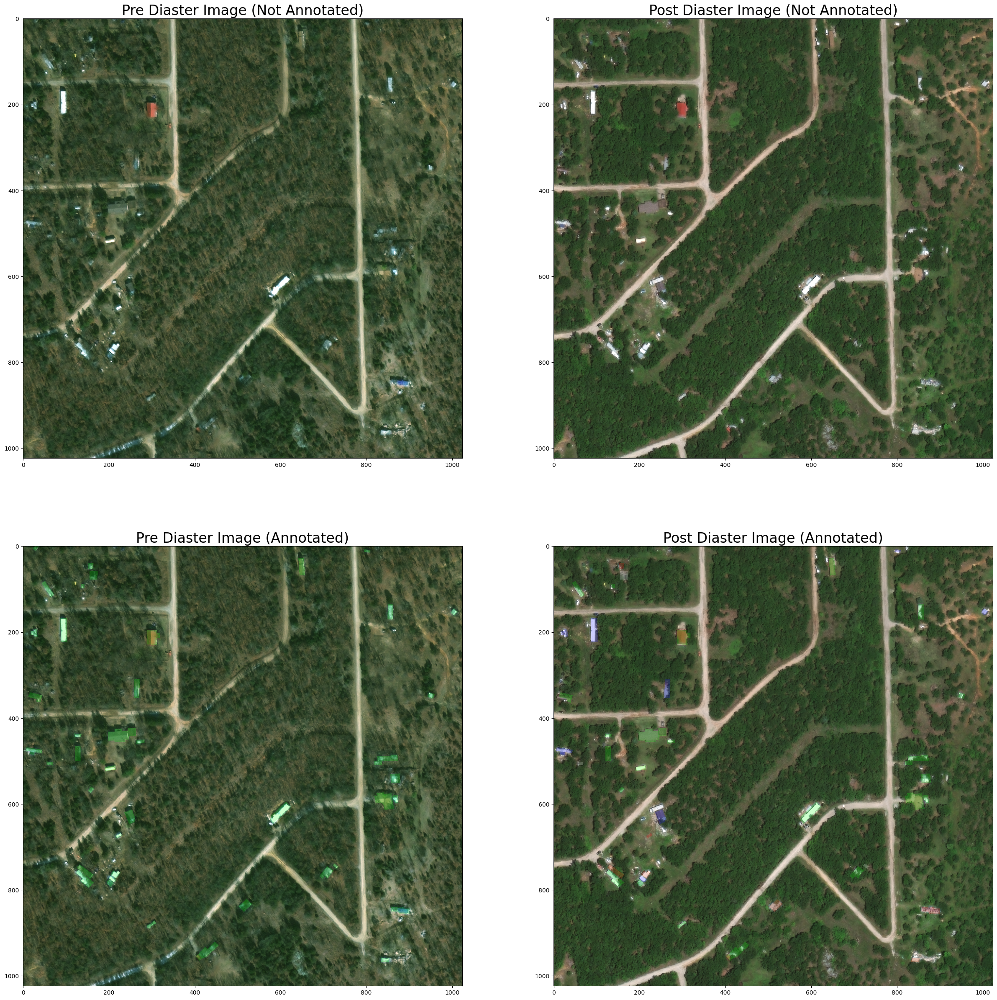

In [16]:
plot_image(disaster_labels[0])

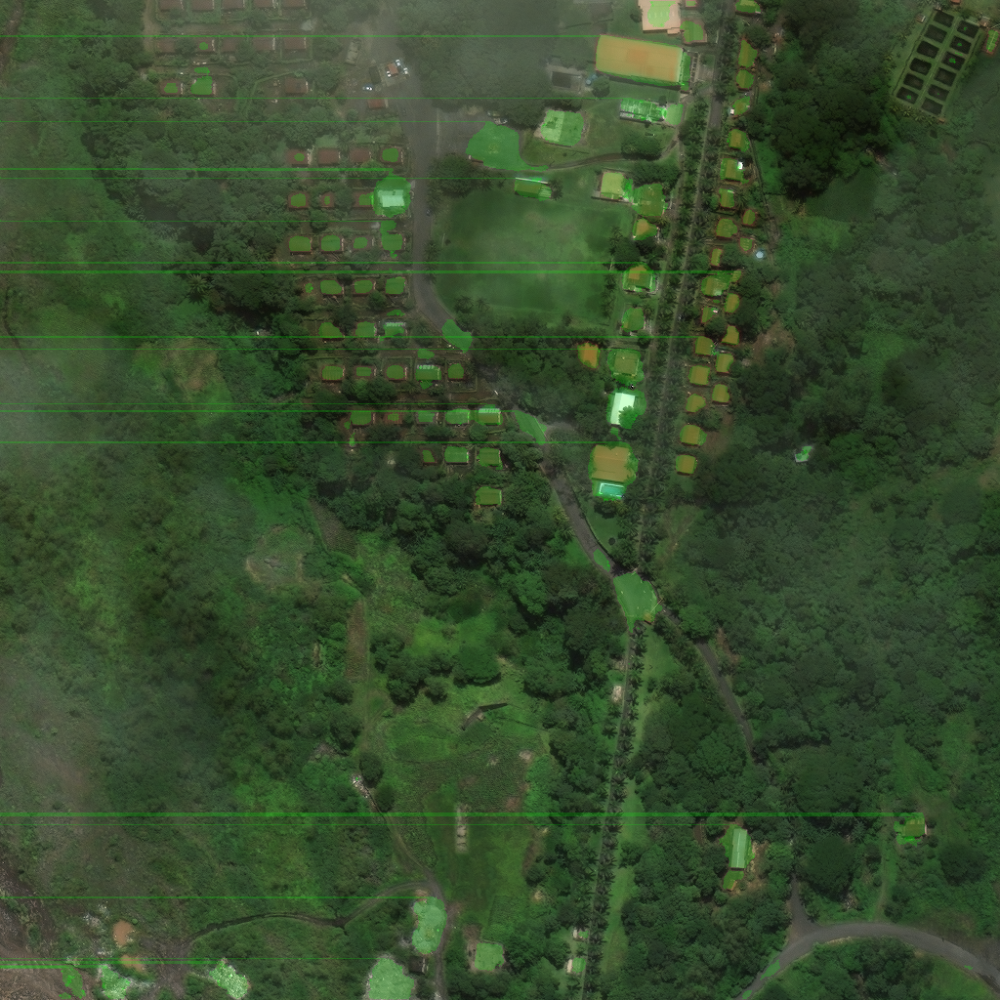

In [16]:
# Display a single image using label path. 
# `time` argument shows post or pre disaster images
# `annotated` argument labels images
display_img('/Users/heshimei/Documents/guatemala-volcano_00000006_post_disaster.json', time='post', annotated=True)

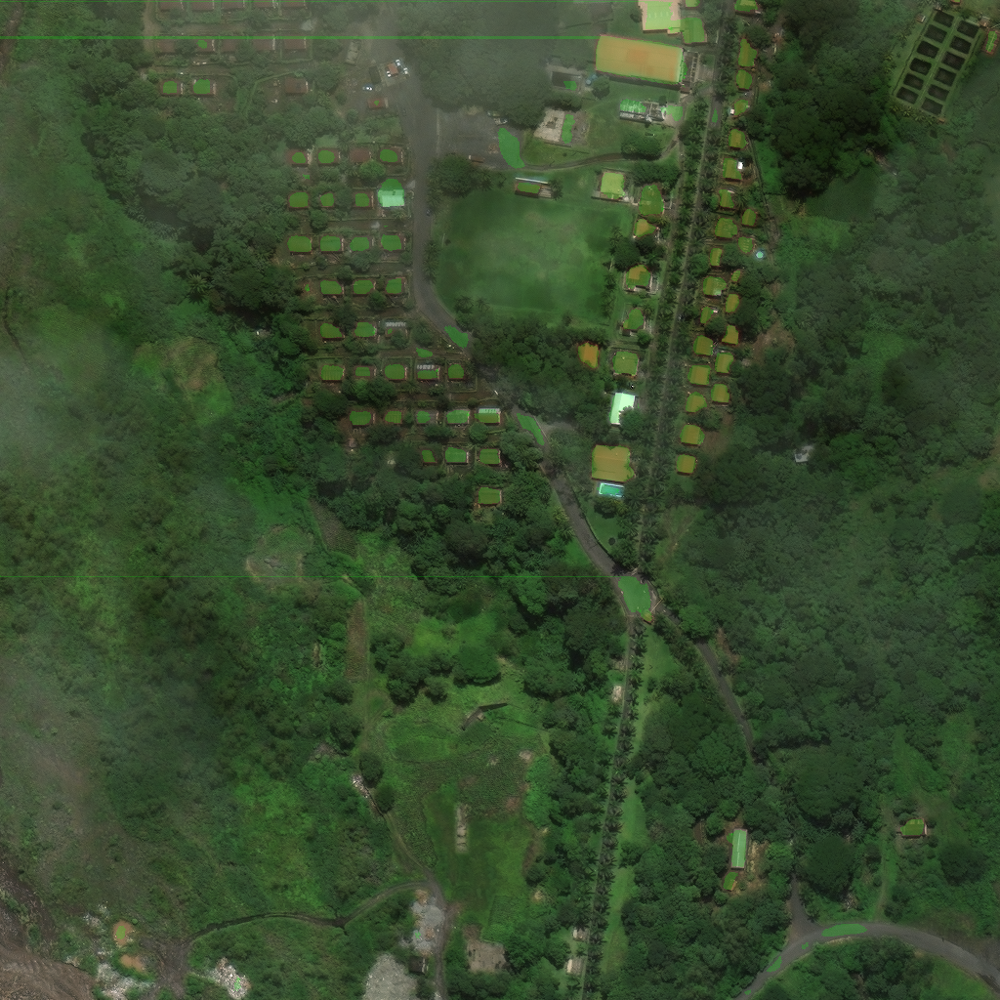

In [17]:
display_img('/Users/heshimei/Downloads/guatemala-volcano_00000006_post_disaster.json', time='post', annotated=True)

In [ ]:
# Get polygons center coords (lat, long)
def get_centroid(coords):
    polygons = [ wkt.loads(polygon['wkt']) for polygon in coords ]
    centroid =  MultiPolygon(polygons).centroid
    try:
        return {'centroid_x': centroid.x, 'centroid_y': centroid.y, 'latlong': centroid }
    except IndexError as e:
        return {'centroid_x': None, 'centroid_y': None, 'latlong': None }

In [ ]:
def get_damage_dict(coords):
    damage_list = [ get_damage_type(coord['properties']) for coord in coords]
    return Counter(damage_list)

In [ ]:
# Add centroid and damage dict to metadata
def metadata_with_damage(label_path):
    data = read_label(label_path)
    coords = data['features']['lng_lat']
    
    damage_dict = get_damage_dict(coords)
    centroid = get_centroid(coords)
    
    data['metadata'].update(centroid)
    data['metadata']['path'] = label_path
    data['metadata'].update(damage_dict)
    return data['metadata']
        
    

In [ ]:
def generate_metadata_df(disaster_labels):
    metadata_list = [metadata_with_damage(label_path) for label_path in disaster_labels]
    df = pd.DataFrame(metadata_list)
    return df.fillna(df.mean())

In [ ]:
# Sort df by destroyed count
df = generate_metadata_df(disaster_labels)
sorted_df = df.sort_values(by=['destroyed'], ascending=False)

In [ ]:
sorted_df

In [ ]:
df_generator = sorted_df.iterrows()

In [ ]:
# Generate Google Maps link to location
from IPython.core.display import display, HTML
def generate_gmaps_link(lat, long):
    link = f"https://www.google.com/maps/@?api=1&map_action=map&center={lat},{long}&zoom=18&basemap=satellite"
    return HTML(f"""<a href="{link}" target="_blank">{link}</a>""")

In [ ]:
# fetch first row (most damaged location)
index, row = next(df_generator)

In [ ]:
# provides google maps link
generate_gmaps_link(row.centroid_y, row.centroid_x)

In [ ]:
# Shows damage polygon counts for image
row[['no-damage', 'minor-damage', 'major-damage', 'destroyed', 'un-classified']]

In [ ]:
# shows pre disaster image
display_img(row.path, time='pre', annotated=True)

In [ ]:
# shows post disaster image
display_img(row.path, time='post', annotated=True)

In [ ]:
# plots pre and post disaster images with annotations
plot_image(row.path)

In [ ]:
def generate_circle(row):
    
    COLOR_MAP = {
        "no-damage": 'green',
        "minor-damage": 'blue',
        "major-damage": '#ffff00',
        "destroyed": 'red',
        "un-classified": 'black'
    }
    
    for damage_type, color in COLOR_MAP.items():
        yield Circle(
            location=row.loc[['centroid_y','centroid_x']].tolist(),
            radius=row.loc[damage_type],
            color=color)

In [ ]:
location = df.mean().loc[['centroid_y','centroid_x']].tolist()

In [ ]:
# CODE FOR THIS CELL IS TAKEN FROM https://www.kaggle.com/alexisbcook/interactive-maps

# mean latitude and longitude
# Create a map
m_2 = folium.Map(location=location, tiles='openstreetmap', zoom_start=13)

# Add points to the map
for idx, row in df.iterrows():
    generator = generate_circle(row)
    for circle in generator:
        circle.add_to(m_2)

# Display the map
embed_map(m_2, 'm_2.html')

In [ ]:
labels_generator = Path('../input').rglob(pattern=f'*.json')
full_df = generate_metadata_df(labels_generator)

In [ ]:
# plot bargraph based on an agg_func
def plot_bargraph(df, x, y, agg_func):
  new_df = df.groupby('disaster', as_index=False).agg(agg_func)

  for index, row in new_df.iterrows():
    plt.bar(row.disaster, row.gsd, label=row.disaster, align='center')
    
#   plt.legend(loc=1,prop={'size':18})

  plt.xticks(fontsize=22, rotation=90)
  fig = plt.gcf()
  fig.set_size_inches(30, 30)
  plt.savefig(f'{agg_func}.png', dpi=100)
  plt.show()

In [ ]:
plot_bargraph(full_df, x='disaster', y='gsd', agg_func='mean')

In [ ]:
# Mean GSD for dataset
full_df['gsd'].mean()

In [ ]:
plot_bargraph(full_df, x='disaster', y='gsd', agg_func='count')

In [ ]:
img = '/Users/heshimei/Documents/guatemala-volcano_00000006_pre_disaster.png'

In [ ]:
img.shape()

In [16]:
image = '/Users/heshimei/Documents/test_airbus.png'

In [17]:
h, w, _ = image.shape

AttributeError: 'str' object has no attribute 'shape'

In [ ]:
h, w, _ = image.shape
h_padded = int(math.ceil(float(h) / 16.0) * 16)
w_padded = int(math.ceil(float(w) / 16.0) * 16)

pad_y1 = (h_padded - h) // 2
pad_x1 = (w_padded - w) // 2
pad_y2 = h_padded - h - pad_y1
pad_x2 = w_padded - w - pad_x1

image_padded = np.pad(image, ((pad_y1, pad_y2), (pad_x1, pad_x2), (0, 0)), 'symmetric')
image_in = (image_padded - self.__mean) / 255.0
image_in = image_in.transpose(2, 0, 1)
image_in = image_in[np.newaxis, :, :, :]
image_in = Variable(np.asarray(image_in, dtype=np.float32))

top, left = pad_y1, pad_x1
bottom, right = top + h, left + w

return image_in, (top, left, bottom, right)